Project 1 - California Water Usage
=================

Welcome to the first project in Data 8! We will be exploring possible connections between water usage, geography, and income in California. The water data for this project was procured from the [California State Water Resources Control Board](http://www2.pacinst.org/gpcd/table.html) and curated by the [Pacific Institute](http://pacinst.org/). The map data includes [US topography](https://github.com/jgoodall/us-maps), [California counties](https://github.com/johan/world.geo.json/tree/master/countries/USA/CA), and [ZIP codes](http://bl.ocks.org/jefffriesen/6892860).

The dataset on income comes from the IRS ([documented here](http://www.irs.gov/pub/irs-soi/13zpdoc.doc)).  We have identified some interesting columns in the dataset, but a full description of all the columns (and a definition of the population in the dataset and some interesting anonymization procedures they used) is available [here](irs_info.pdf).

#### Administrivia
##### Piazza
While collaboration is encouraged on this and other assignments, sharing answers is never okay. In particular, posting code or other assignment answers publicly on Piazza (or elsewhere) is academic dishonesty. It will result in a reduced project grade at a minimum. If you wish to ask a question and include code, you *must* make it a private post.

##### Partners
You may complete the project with up to one partner. Partnerships are an exception to the rule against sharing answers. If you have a partner, one person in the partnership should submit your project on Gradescope and include the other partner in the submission. (Gradescope will prompt you to fill this in.)

Your partner *must be in your lab section*.  You can ask your TA to pair you with someone from your lab if you’re unable to find a partner.  (That will happen in lab the week the project comes out.)

##### Due Date and Checkpoint
Part of the project will be due early.  Parts 1 and 2 of the project (out of 3) are due **Tuesday, September 27th at 5PM**.  Unlike the final submission, this early checkpoint  will be graded for completion. It will be worth approximately 10% of the total project grade.  Simply submit your partially-completed notebook as a PDF, as you would submit any other notebook.  (See the note above on submitting with a partner.)

The entire project (parts 1, 2, and 3) will be due **Tuesday, October 4 at 5PM**. (Again, see the note above on submitting with a partner.)

#### On to the project!
As usual, **run the cell below** to prepare the automatic tests. **Passing the automatic tests does not guarantee full credit on any question.** The tests are provided to help catch some common errors, but it is *your* responsibility to answer the questions correctly.

In [10]:
# Run this cell, but please don't change it.

import numpy as np
import math
from datascience import *

# These lines set up the plotting functionality and formatting.
import matplotlib
matplotlib.use('Agg', warn=False)
%matplotlib inline
import matplotlib.pyplot as plots
plots.style.use('fivethirtyeight')

# These lines load the tests.
from client.api.assignment import load_assignment 
tests = load_assignment('project1.ok')

Assignment: California Water Usage
OK, version v1.14.15



First, load the data. Loading may take some time.

In [11]:
# Run this cell, but please don't change it.

districts = Map.read_geojson('water_districts.geojson')
zips = Map.read_geojson('ca_zips.geojson.gz')
usage_raw = Table.read_table('water_usage.csv', dtype={'pwsid': str})
income_raw = Table.read_table('ca_income_by_zip.csv', dtype={'ZIP': str}).drop('STATEFIPS', 'STATE', 'agi_stub')
wd_vs_zip = Table.read_table('wd_vs_zip.csv', dtype={'PWSID': str, 'ZIP': str}).set_format(make_array(2, 3), PercentFormatter)

Part 1: Maps
======

The `districts` and `zips` data sets are `Map` objects. Documentation on mapping in the `datascience` package can be found at [data8.org/datascience/maps.html](http://data8.org/datascience/maps.html).  To view a map of California's water districts, run the cell below. Click on a district to see its description.

In [12]:
districts.format(width=400, height=200)

A `Map` is a collection of regions and other features such as points and markers, each of which has a **string** `id` and various properties. You can view the features of the `districts` map as a table using `Table.from_records`.

In [13]:
district_table = Table.from_records(districts.features)
district_table.show(3)

In [14]:
district_table.column('feature')[0]

To display a `Map` containing only two features from the `district_table`, call `Map` on an array containing those two features from the `feature` column.

**Question 1.1.** Draw a map of the Alameda County Water District (row 0) and the East Bay Municipal Utilities District (row 2).

In [15]:
# Fill in the next line so the last line draws a map of those two districts.
alameda_and_east_bay = district_table.column("feature")[0:3:2]
Map(alameda_and_east_bay, height=300, width=300)

In [16]:
_ = tests.grade('q11')

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Running tests

---------------------------------------------------------------------
Test summary
    Passed: 2
    Failed: 0
[ooooooooook] 100.0% passed



*Hint*: If scrolling becomes slow on your computer, you can clear maps for the cells above by running `Cell > All Output > Clear` from the `Cell` menu. 

Part 2: California Income
=======

Let's look at the `income_raw` table, which comes from the IRS.  We're going to link this information about incomes to our information about water. First, we need to investigate the income data and get it into a more usable form.

In [17]:
income_raw

ZIP,N1,MARS1,MARS2,MARS4,PREP,N2,NUMDEP,A00100,N02650,A02650,N00200,A00200,N00300,A00300,N00600,A00600,N00650,A00650,N00700,A00700,N00900,A00900,N01000,A01000,N01400,A01400,N01700,A01700,SCHF,N02300,A02300,N02500,A02500,N26270,A26270,N02900,A02900,N03220,A03220,N03300,A03300,N03270,A03270,N03150,A03150,N03210,A03210,N03230,A03230,N03240,A03240,N04470,A04470,A00101,N18425,A18425,N18450,A18450,N18500,A18500,N18300,A18300,N19300,A19300,N19700,A19700,N04800,A04800,N05800,A05800,N09600,A09600,N07100,A07100,N07300,A07300,N07180,A07180,N07230,A07230,N07240,A07240,N07220,A07220,N07260,A07260,N09400,A09400,N10600,A10600,N59660,A59660,N59720,A59720,N11070,A11070,N10960,A10960,N06500,A06500,N10300,A10300,N85330,A85330,N85300,A85300,N11901,A11901,N11902,A11902
90001,13100,6900,1890,4270,10740,29670,15200,181693,13100,184344,10220,142287,640,96,50,69,30,20,180,55,3490,31751,70,-17,60,382,380,3001,0,950,4493,80,123,30,105,3510,2651,20,6,0,0,0,0,0,0,150,119,60,98,0,0,510,7212,8498,170,95,270,154,340,952,500,1424,340,3168,240,363,4200,20798,4190,2176,0,0,1800,623,0,0,70,28,520,248,240,39,1020,304,0,0,3290,4659,12180,37759,6320,20531,5880,16995,6500,8805,1230,980,2680,1554,5800,6197,0,0,0,0,1220,856,11480,32934
90001,5900,1700,1970,2210,4960,17550,9690,203628,5900,204512,5610,188556,830,68,60,32,70,19,660,351,540,5917,60,111,50,489,310,4450,0,460,2522,210,947,40,831,700,885,50,12,0,0,0,0,50,152,200,154,50,81,0,0,1260,20442,46800,800,1023,430,505,810,2383,1250,4605,820,7172,870,1620,5300,74352,5290,8710,0,0,3380,2947,0,0,370,249,620,518,630,114,2520,2047,20,6,410,982,5820,23531,2160,4562,1890,3948,2520,4160,600,441,3180,5762,3460,6754,0,0,0,0,530,797,5360,17656
90001,1480,330,760,390,1240,4710,2470,89065,1480,89344,1440,82579,400,32,20,12,0,0,460,477,130,1351,40,1,40,660,140,2599,0,150,892,60,670,0,0,210,279,50,14,0,0,0,0,0,0,90,76,0,0,0,0,680,13264,41920,540,1329,120,294,500,1453,680,3591,490,4248,560,1296,1470,49298,1470,6618,0,0,900,1488,0,0,120,90,180,198,80,11,750,1163,20,7,80,232,1470,8950,0,0,0,0,190,256,170,132,1290,5131,1310,5417,0,0,0,0,230,520,1250,4050
90001,330,50,210,70,290,1100,560,28395,330,28555,320,25271,130,10,20,24,30,29,160,235,60,1084,0,0,0,0,40,1044,0,40,230,30,598,0,0,60,160,0,0,0,0,0,0,0,0,30,21,0,0,0,0,210,4846,18256,190,734,30,67,160,477,210,1437,160,1488,180,514,330,17918,330,2627,0,0,190,380,0,0,50,37,60,66,0,0,180,309,0,0,40,191,330,3127,0,0,0,0,0,0,50,41,330,2247,330,2398,0,0,0,0,70,289,270,1014
90001,160,30,100,40,130,510,250,24676,160,25017,150,17851,70,35,20,71,0,0,70,140,0,0,20,88,0,0,20,477,0,0,0,0,0,20,2967,40,186,0,0,0,0,0,0,0,0,0,0,0,0,0,0,130,4063,20530,120,1362,0,0,100,447,130,1980,90,1086,100,429,160,18375,160,3889,30,124,80,145,0,0,0,0,0,0,0,0,60,74,0,0,0,0,160,3868,0,0,0,0,0,0,0,0,160,3723,160,3897,0,0,0,0,60,702,100,474
90001,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
90002,12150,6330,1460,4330,9580,27240,14070,167261,12150,170095,9440,126482,610,73,50,19,40,9,150,49,3610,34019,50,9,50,196,380,3133,0,900,4222,70,84,30,116,3630,2834,30,7,0,0,0,0,0,0,170,133,50,103,0,0,540,7237,8945,170,124,300,175,360,987,530,1621,390,3444,260,367,3750,18438,3750,1927,0,0,1800,618,0,0,100,35,540,242,240,39,980,300,0,0,3400,4983,11540,39973,6940,23487,6550,19268,6380,8439,1520,1330,2210,1310,5520,6298,0,0,0,0,930,642,10960,34691
90002,5030,1510,1490,1980,4120,14410,7890,173280,5030,174335,4760,159099,790,52,60,41,40,17,620,351,560,6015,70,-10,40,237,320,5075,0,390,2070,180,831,0,0,710,1055,50,11,0,0,0,0,40,107,190,179,50,99,0,0,1330,21281,49334,840,1008,440,489,900,2430,1320,4684,920,7738,960,2253,4550,63887,4540,7503,0,0,2840,2550,0,0,330,234,590,523,500,89,2050,1688,30,9,420,1003,4960,20637,2020,4371,1750,3736,2140,3459,560,455,2740,4953,3070,5998,0,0,0,0,420,782,4590,15527
90002,1320,300,600,400,1060,4090,2180,78559,1320,78871,1270,72098,390,

Some observations:

1. The table contains several numerical columns and a column for the ZIP code.
2. For each ZIP code, there are 6 rows.  Each row for a ZIP code has data from tax returns in one *income bracket*. (A tax return is the tax filing from one person or household. An income bracket is a group of people whose annual income is in some range, like \$25,000 to $34,999.)
3. According to the IRS documentation, all the numerical columns are *totals* -- either total numbers of returns that fall into various categories, or total amounts of money (in thousands of dollars) from returns in those categories.  For example, the column `'N02650'` is the number of returns that included a total income amount, and `'A02650'` is the total amount of total income (in thousands of dollars) from those returns.

For the analysis we're about to do, we won't need to use the information about tax brackets.  We will need to know the total income, total number of returns, and other totals from each ZIP code.

**Question 2.1.**  Assign the name `income_by_zipcode` to a table with just one row per ZIP code. When you group according to ZIP code, the remaining columns should be summed. In other words, for any other column such as `'N02650'`, the value of `'N02650'` in a row corresponding to ZIP code 90210 (for example) should be the sum of the values of `'N02650'` in the 6 rows of `income_raw` corresponding to ZIP code 90210.

In [18]:
test=np.array([1,2,3])
test


def sumsix(ZIParray):
    return np.sum(ZIParray)
    
    
print(sumsix(test))
test=income_raw.where("ZIP", are.equal_to("90001")).column(1)
print(sumsix(test))

6
20970.0


In [19]:
changed_cell=income_raw.where("ZIP", are.equal_to("90001")).take(0)
changed_cell.column(1)[0]=sumsix(income_raw.where("ZIP", are.equal_to("90001")).column(1))
changed_cell

ZIP,N1,MARS1,MARS2,MARS4,PREP,N2,NUMDEP,A00100,N02650,A02650,N00200,A00200,N00300,A00300,N00600,A00600,N00650,A00650,N00700,A00700,N00900,A00900,N01000,A01000,N01400,A01400,N01700,A01700,SCHF,N02300,A02300,N02500,A02500,N26270,A26270,N02900,A02900,N03220,A03220,N03300,A03300,N03270,A03270,N03150,A03150,N03210,A03210,N03230,A03230,N03240,A03240,N04470,A04470,A00101,N18425,A18425,N18450,A18450,N18500,A18500,N18300,A18300,N19300,A19300,N19700,A19700,N04800,A04800,N05800,A05800,N09600,A09600,N07100,A07100,N07300,A07300,N07180,A07180,N07230,A07230,N07240,A07240,N07220,A07220,N07260,A07260,N09400,A09400,N10600,A10600,N59660,A59660,N59720,A59720,N11070,A11070,N10960,A10960,N06500,A06500,N10300,A10300,N85330,A85330,N85300,A85300,N11901,A11901,N11902,A11902
90001,20970,6900,1890,4270,10740,29670,15200,181693,13100,184344,10220,142287,640,96,50,69,30,20,180,55,3490,31751,70,-17,60,382,380,3001,0,950,4493,80,123,30,105,3510,2651,20,6,0,0,0,0,0,0,150,119,60,98,0,0,510,7212,8498,170,95,270,154,340,952,500,1424,340,3168,240,363,4200,20798,4190,2176,0,0,1800,623,0,0,70,28,520,248,240,39,1020,304,0,0,3290,4659,12180,37759,6320,20531,5880,16995,6500,8805,1230,980,2680,1554,5800,6197,0,0,0,0,1220,856,11480,32934


In [20]:
income_by_zipcode = income_raw.group("ZIP", sum)
income_by_zipcode

ZIP,N1 sum,MARS1 sum,MARS2 sum,MARS4 sum,PREP sum,N2 sum,NUMDEP sum,A00100 sum,N02650 sum,A02650 sum,N00200 sum,A00200 sum,N00300 sum,A00300 sum,N00600 sum,A00600 sum,N00650 sum,A00650 sum,N00700 sum,A00700 sum,N00900 sum,A00900 sum,N01000 sum,A01000 sum,N01400 sum,A01400 sum,N01700 sum,A01700 sum,SCHF sum,N02300 sum,A02300 sum,N02500 sum,A02500 sum,N26270 sum,A26270 sum,N02900 sum,A02900 sum,N03220 sum,A03220 sum,N03300 sum,A03300 sum,N03270 sum,A03270 sum,N03150 sum,A03150 sum,N03210 sum,A03210 sum,N03230 sum,A03230 sum,N03240 sum,A03240 sum,N04470 sum,A04470 sum,A00101 sum,N18425 sum,A18425 sum,N18450 sum,A18450 sum,N18500 sum,A18500 sum,N18300 sum,A18300 sum,N19300 sum,A19300 sum,N19700 sum,A19700 sum,N04800 sum,A04800 sum,N05800 sum,A05800 sum,N09600 sum,A09600 sum,N07100 sum,A07100 sum,N07300 sum,A07300 sum,N07180 sum,A07180 sum,N07230 sum,A07230 sum,N07240 sum,A07240 sum,N07220 sum,A07220 sum,N07260 sum,A07260 sum,N09400 sum,A09400 sum,N10600 sum,A10600 sum,N59660 sum,A59660 sum,N59720 sum,A59720 sum,N11070 sum,A11070 sum,N10960 sum,A10960 sum,N06500 sum,A06500 sum,N10300 sum,A10300 sum,N85330 sum,A85330 sum,N85300 sum,A85300 sum,N11901 sum,A11901 sum,N11902 sum,A11902 sum
90001,20970,9010,4930,6980,17360,53540,28170,527457,20970,531772,17740,456544,2070,241,170,208,130,68,1530,1258,4220,40103,190,183,150,1531,890,11571,0,1600,8137,380,2338,90,3903,4520,4161,120,32,0,0,0,0,50,152,470,370,110,179,0,0,2790,49827,136004,1820,4543,850,1020,1910,5712,2770,13037,1900,17162,1950,4222,11460,180741,11440,24020,30,124,6350,5583,0,0,610,404,1380,1030,950,164,4530,3897,40,13,3820,6064,19960,77235,8480,25093,7770,20943,9210,13221,2050,1594,7640,18417,11060,24663,0,0,0,0,2110,3164,18460,56128
90002,18960,8230,3830,6800,15120,47200,24850,462823,18960,467128,15910,396088,1960,227,170,72,130,30,1450,1196,4310,40865,170,257,130,985,950,14167,0,1450,7131,360,2344,30,116,4610,4305,130,29,0,0,0,0,60,161,470,411,100,202,0,0,2910,50033,133338,1880,3809,900,1003,2070,5698,2890,12370,2100,18397,2060,5197,10070,153993,10060,19696,20,24,5660,4942,0,0,610,403,1350,1006,810,138,3910,3362,50,15,3900,6159,18270,73561,8960,27858,8300,23004,8710,12170,2280,1943,6520,14756,10180,21012,0,0,0,0,1630,2176,17040,55190
90003,26180,11310,5130,9640,20570,64470,33760,612733,26180,618848,21680,518846,2410,393,220,100,170,39,1690,1339,6240,59400,230,275,170,1528,1120,16814,0,1880,9002,490,3204,90,1173,6490,6102,150,39,0,0,30,97,90,262,560,477,160,284,0,0,3300,57436,147488,2110,4120,1000,1089,2250,6165,3280,13216,2290,21225,2260,5650,13410,196510,13410,24756,20,19,7510,6410,0,0,780,497,1780,1335,1060,184,5210,4347,50,13,5620,8885,25030,95254,11910,36094,10940,29504,11950,16777,3190,2789,8680,18348,13880,27416,0,0,0,0,2670,3534,23100,72074
90004,27360,15330,7000,4670,20260,51180,17800,1.61777e+06,27360,1.64943e+06,22010,1.02928e+06,5270,20986,2890,37375,2670,26861,2650,7675,7390,102468,2820,83652,910,18993,1660,36911,0,1840,11778,1310,18705,1480,216013,9000,31663,280,69,240,8545,810,5683,440,2188,1740,1811,260,562,30,555,5510,240787,1.07313e+06,4470,98390,860,996,2910,25109,5470,126876,2560,45167,4390,37387,18590,1.07024e+06,18510,259534,1010,10245,6420,7893,990,1973,620,361,1680,1378,990,175,3010,2817,50,25,6600,17090,25170,318535,7180,14936,5470,11397,4720,6107,1990,1554,16120,252178,20150,276712,690,2166,820,4768,6360,32663,19660,59388
90005,15430,8550,3870,2830,11210,29910,11130,707020,15430,717290,12610,454410,2230,5575,1000,5358,910,3785,990,2305,3950,46369,1080,19080,270,5008,590,11898,0,830,5514,450,5601,650,112194,4900,10270,120,29,50,1631,250,1436,220,1064,990,990,150,367,0,0,2170,91544,387528,1620,37572,460,514,1060,8951,2170,47820,980,16705,1580,10994,9720,433364,9700,99692,260,2993,3240,3165,260,264,300,193,920,752,470,87,1700,1480,0,0,3550,7585,14110,125690,4140,8192,3160,6289,3220,4378,1110,881,8210,96559,10540,105653,180,545,190,713,3550,14752,11260,28426
90006,22630,11470,5400,5630,17840,47590,20210,563530,22630,571157,18360,466220,2130,841,560,949

In [21]:
_ = tests.grade('q21')

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Running tests

---------------------------------------------------------------------
Test summary
    Passed: 2
    Failed: 0
[ooooooooook] 100.0% passed



Your `income_by_zipcode` table probably has column names like `N1 sum`, which looks a little weird.

**Question 2.2.** Relabel the columns in `income_by_zipcode` to match the labels in `income_raw`

*Hint:* Inspect `income_raw.labels` and `income_by_zipcode.labels` to find the differences you need to change.

*Hint 2:* Since there are many columns, it will be easier to relabel each of them by using a `for` statement. See Chapter 8 of the textbook for details.

*Hint 3:* You can use the `replace` method of a string to remove excess content. See [lab02](../../lab/lab02/) for examples.

*Hint 4:* To create a new table from an existing table with one label replaced, use `relabeled`. To **change** a label in an existing table permanently, use `relabel`. Both methods take two arguments: the old label and the new label. You can solve this problem with either one, but `relabel` is simpler.

In [22]:
income_by_zipcode=income_by_zipcode.relabeled(income_by_zipcode.labels[1],income_by_zipcode.labels[1].replace(' sum', ''))
income_by_zipcode=income_by_zipcode.relabeled(income_by_zipcode.labels[2],income_by_zipcode.labels[2].replace(' sum', ''))
income_by_zipcode

ZIP,N1,MARS1,MARS2 sum,MARS4 sum,PREP sum,N2 sum,NUMDEP sum,A00100 sum,N02650 sum,A02650 sum,N00200 sum,A00200 sum,N00300 sum,A00300 sum,N00600 sum,A00600 sum,N00650 sum,A00650 sum,N00700 sum,A00700 sum,N00900 sum,A00900 sum,N01000 sum,A01000 sum,N01400 sum,A01400 sum,N01700 sum,A01700 sum,SCHF sum,N02300 sum,A02300 sum,N02500 sum,A02500 sum,N26270 sum,A26270 sum,N02900 sum,A02900 sum,N03220 sum,A03220 sum,N03300 sum,A03300 sum,N03270 sum,A03270 sum,N03150 sum,A03150 sum,N03210 sum,A03210 sum,N03230 sum,A03230 sum,N03240 sum,A03240 sum,N04470 sum,A04470 sum,A00101 sum,N18425 sum,A18425 sum,N18450 sum,A18450 sum,N18500 sum,A18500 sum,N18300 sum,A18300 sum,N19300 sum,A19300 sum,N19700 sum,A19700 sum,N04800 sum,A04800 sum,N05800 sum,A05800 sum,N09600 sum,A09600 sum,N07100 sum,A07100 sum,N07300 sum,A07300 sum,N07180 sum,A07180 sum,N07230 sum,A07230 sum,N07240 sum,A07240 sum,N07220 sum,A07220 sum,N07260 sum,A07260 sum,N09400 sum,A09400 sum,N10600 sum,A10600 sum,N59660 sum,A59660 sum,N59720 sum,A59720 sum,N11070 sum,A11070 sum,N10960 sum,A10960 sum,N06500 sum,A06500 sum,N10300 sum,A10300 sum,N85330 sum,A85330 sum,N85300 sum,A85300 sum,N11901 sum,A11901 sum,N11902 sum,A11902 sum
90001,20970,9010,4930,6980,17360,53540,28170,527457,20970,531772,17740,456544,2070,241,170,208,130,68,1530,1258,4220,40103,190,183,150,1531,890,11571,0,1600,8137,380,2338,90,3903,4520,4161,120,32,0,0,0,0,50,152,470,370,110,179,0,0,2790,49827,136004,1820,4543,850,1020,1910,5712,2770,13037,1900,17162,1950,4222,11460,180741,11440,24020,30,124,6350,5583,0,0,610,404,1380,1030,950,164,4530,3897,40,13,3820,6064,19960,77235,8480,25093,7770,20943,9210,13221,2050,1594,7640,18417,11060,24663,0,0,0,0,2110,3164,18460,56128
90002,18960,8230,3830,6800,15120,47200,24850,462823,18960,467128,15910,396088,1960,227,170,72,130,30,1450,1196,4310,40865,170,257,130,985,950,14167,0,1450,7131,360,2344,30,116,4610,4305,130,29,0,0,0,0,60,161,470,411,100,202,0,0,2910,50033,133338,1880,3809,900,1003,2070,5698,2890,12370,2100,18397,2060,5197,10070,153993,10060,19696,20,24,5660,4942,0,0,610,403,1350,1006,810,138,3910,3362,50,15,3900,6159,18270,73561,8960,27858,8300,23004,8710,12170,2280,1943,6520,14756,10180,21012,0,0,0,0,1630,2176,17040,55190
90003,26180,11310,5130,9640,20570,64470,33760,612733,26180,618848,21680,518846,2410,393,220,100,170,39,1690,1339,6240,59400,230,275,170,1528,1120,16814,0,1880,9002,490,3204,90,1173,6490,6102,150,39,0,0,30,97,90,262,560,477,160,284,0,0,3300,57436,147488,2110,4120,1000,1089,2250,6165,3280,13216,2290,21225,2260,5650,13410,196510,13410,24756,20,19,7510,6410,0,0,780,497,1780,1335,1060,184,5210,4347,50,13,5620,8885,25030,95254,11910,36094,10940,29504,11950,16777,3190,2789,8680,18348,13880,27416,0,0,0,0,2670,3534,23100,72074
90004,27360,15330,7000,4670,20260,51180,17800,1.61777e+06,27360,1.64943e+06,22010,1.02928e+06,5270,20986,2890,37375,2670,26861,2650,7675,7390,102468,2820,83652,910,18993,1660,36911,0,1840,11778,1310,18705,1480,216013,9000,31663,280,69,240,8545,810,5683,440,2188,1740,1811,260,562,30,555,5510,240787,1.07313e+06,4470,98390,860,996,2910,25109,5470,126876,2560,45167,4390,37387,18590,1.07024e+06,18510,259534,1010,10245,6420,7893,990,1973,620,361,1680,1378,990,175,3010,2817,50,25,6600,17090,25170,318535,7180,14936,5470,11397,4720,6107,1990,1554,16120,252178,20150,276712,690,2166,820,4768,6360,32663,19660,59388
90005,15430,8550,3870,2830,11210,29910,11130,707020,15430,717290,12610,454410,2230,5575,1000,5358,910,3785,990,2305,3950,46369,1080,19080,270,5008,590,11898,0,830,5514,450,5601,650,112194,4900,10270,120,29,50,1631,250,1436,220,1064,990,990,150,367,0,0,2170,91544,387528,1620,37572,460,514,1060,8951,2170,47820,980,16705,1580,10994,9720,433364,9700,99692,260,2993,3240,3165,260,264,300,193,920,752,470,87,1700,1480,0,0,3550,7585,14110,125690,4140,8192,3160,6289,3220,4378,1110,881,8210,96559,10540,105653,180,545,190,713,3550,14752,11260,28426
90006,22630,11470,5400,5630,17840,47590,20210,563530,22630,571157,18360,466220,2130,841,560,949,490,631

In [23]:
for i in range(len(income_by_zipcode.labels)):
    income_by_zipcode=income_by_zipcode.relabeled(income_by_zipcode.labels[i],income_by_zipcode.labels[i].replace(' sum', ''))
    
    #income_by_zipcode.labels(i).replace(' sum', '')
    #income_by_zipcode.relabeled(i, "N1")
    #print(i)
#income_by_zipcode
income_by_zipcode


ZIP,N1,MARS1,MARS2,MARS4,PREP,N2,NUMDEP,A00100,N02650,A02650,N00200,A00200,N00300,A00300,N00600,A00600,N00650,A00650,N00700,A00700,N00900,A00900,N01000,A01000,N01400,A01400,N01700,A01700,SCHF,N02300,A02300,N02500,A02500,N26270,A26270,N02900,A02900,N03220,A03220,N03300,A03300,N03270,A03270,N03150,A03150,N03210,A03210,N03230,A03230,N03240,A03240,N04470,A04470,A00101,N18425,A18425,N18450,A18450,N18500,A18500,N18300,A18300,N19300,A19300,N19700,A19700,N04800,A04800,N05800,A05800,N09600,A09600,N07100,A07100,N07300,A07300,N07180,A07180,N07230,A07230,N07240,A07240,N07220,A07220,N07260,A07260,N09400,A09400,N10600,A10600,N59660,A59660,N59720,A59720,N11070,A11070,N10960,A10960,N06500,A06500,N10300,A10300,N85330,A85330,N85300,A85300,N11901,A11901,N11902,A11902
90001,20970,9010,4930,6980,17360,53540,28170,527457,20970,531772,17740,456544,2070,241,170,208,130,68,1530,1258,4220,40103,190,183,150,1531,890,11571,0,1600,8137,380,2338,90,3903,4520,4161,120,32,0,0,0,0,50,152,470,370,110,179,0,0,2790,49827,136004,1820,4543,850,1020,1910,5712,2770,13037,1900,17162,1950,4222,11460,180741,11440,24020,30,124,6350,5583,0,0,610,404,1380,1030,950,164,4530,3897,40,13,3820,6064,19960,77235,8480,25093,7770,20943,9210,13221,2050,1594,7640,18417,11060,24663,0,0,0,0,2110,3164,18460,56128
90002,18960,8230,3830,6800,15120,47200,24850,462823,18960,467128,15910,396088,1960,227,170,72,130,30,1450,1196,4310,40865,170,257,130,985,950,14167,0,1450,7131,360,2344,30,116,4610,4305,130,29,0,0,0,0,60,161,470,411,100,202,0,0,2910,50033,133338,1880,3809,900,1003,2070,5698,2890,12370,2100,18397,2060,5197,10070,153993,10060,19696,20,24,5660,4942,0,0,610,403,1350,1006,810,138,3910,3362,50,15,3900,6159,18270,73561,8960,27858,8300,23004,8710,12170,2280,1943,6520,14756,10180,21012,0,0,0,0,1630,2176,17040,55190
90003,26180,11310,5130,9640,20570,64470,33760,612733,26180,618848,21680,518846,2410,393,220,100,170,39,1690,1339,6240,59400,230,275,170,1528,1120,16814,0,1880,9002,490,3204,90,1173,6490,6102,150,39,0,0,30,97,90,262,560,477,160,284,0,0,3300,57436,147488,2110,4120,1000,1089,2250,6165,3280,13216,2290,21225,2260,5650,13410,196510,13410,24756,20,19,7510,6410,0,0,780,497,1780,1335,1060,184,5210,4347,50,13,5620,8885,25030,95254,11910,36094,10940,29504,11950,16777,3190,2789,8680,18348,13880,27416,0,0,0,0,2670,3534,23100,72074
90004,27360,15330,7000,4670,20260,51180,17800,1.61777e+06,27360,1.64943e+06,22010,1.02928e+06,5270,20986,2890,37375,2670,26861,2650,7675,7390,102468,2820,83652,910,18993,1660,36911,0,1840,11778,1310,18705,1480,216013,9000,31663,280,69,240,8545,810,5683,440,2188,1740,1811,260,562,30,555,5510,240787,1.07313e+06,4470,98390,860,996,2910,25109,5470,126876,2560,45167,4390,37387,18590,1.07024e+06,18510,259534,1010,10245,6420,7893,990,1973,620,361,1680,1378,990,175,3010,2817,50,25,6600,17090,25170,318535,7180,14936,5470,11397,4720,6107,1990,1554,16120,252178,20150,276712,690,2166,820,4768,6360,32663,19660,59388
90005,15430,8550,3870,2830,11210,29910,11130,707020,15430,717290,12610,454410,2230,5575,1000,5358,910,3785,990,2305,3950,46369,1080,19080,270,5008,590,11898,0,830,5514,450,5601,650,112194,4900,10270,120,29,50,1631,250,1436,220,1064,990,990,150,367,0,0,2170,91544,387528,1620,37572,460,514,1060,8951,2170,47820,980,16705,1580,10994,9720,433364,9700,99692,260,2993,3240,3165,260,264,300,193,920,752,470,87,1700,1480,0,0,3550,7585,14110,125690,4140,8192,3160,6289,3220,4378,1110,881,8210,96559,10540,105653,180,545,190,713,3550,14752,11260,28426
90006,22630,11470,5400,5630,17840,47590,20210,563530,22630,571157,18360,466220,2130,841,560,949,490,631,980,1084,5730,54327,610,3191,230,1827,650,7700,0,1220,6570,470,3388,340,11002,6500,7628,120,28,0,0,130,402,190,898,920,910,130,305,0,0,2040,41866,130856,1380,5958,550,636,970,3901,2020,11393,940,11218,1400,4235,12680,233059,12640,33292,70,260,4980,4065,100,12,390,247,1310,1031,760,147,3080,2517,0,0,5320,8272,20900,72585,7800,18122,6230,14213,6600,8904,1780,1391,9890,29220,14110,37674,0,0,20,82,4350,6859,17660,41538
90007,11710,

In [24]:
_ = tests.grade('q22')

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Running tests

---------------------------------------------------------------------
Test summary
    Passed: 1
    Failed: 0
[ooooooooook] 100.0% passed



**Question 2.3.**
Create a table called `income` with  one row per ZIP code and the following columns.

1. A `ZIP` column with the same contents as `'ZIP'` from `income_by_zipcode`.
2. A `num returns` column containing the total number of tax returns that include a total income amount (column `'N02650'` from `income_by_zipcode`).
3. A `total income ($)` column containing the total income in all tax returns in thousands of dollars (column `'A02650'` from `income_by_zipcode`).
4. A `num farmers` column containing the number of farmer returns (column `'SCHF'` from `income_by_zipcode`).

In [25]:
hold=income_by_zipcode.select("ZIP","N02650","A02650","SCHF")
hold=hold.relabeled(
    ["N02650","A02650","SCHF"],["num returns","total income ($)","num farmers"])

income=hold
income

#income = Table().with_columns(
        
#    )
income.set_format('total income ($)', NumberFormatter(0)).show(5)

ZIP,num returns,total income ($),num farmers
90001,20970,"531,772",0
90002,18960,"467,128",0
90003,26180,"618,848",0
90004,27360,"1,649,431",0
90005,15430,"717,290",0


In [26]:
_ = tests.grade('q23')

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Running tests

---------------------------------------------------------------------
Test summary
    Passed: 2
    Failed: 0
[ooooooooook] 100.0% passed



**Question 2.4.** All ZIP codes with less than 100 returns (or some other special conditions) are grouped together into one ZIP code with a special code. Remove the row for that ZIP code from the `income` table.

*Hint 1:* This ZIP code value has far more returns than any of the other ZIP codes.  Try using `group` and `sort` to find it.

*Hint 2:* To **remove** a row in the `income` table using `where`, assign `income` to the smaller table using the following expression structure:

    income = income.where(...)
    
*Hint 3:* Each ZIP code is represented as a string, not an `int`.

In [27]:
income.sort('num returns', descending='true').show(3)
income=income.where("ZIP", are.not_equal_to("99999"))
income.sort('num returns', descending='true').show(3)

ZIP,num returns,total income ($),num farmers
99999,397330,"29,613,733",3240
90650,44600,"1,821,160",0
90250,42350,"1,744,745",0


ZIP,num returns,total income ($),num farmers
90650,44600,"1,821,160",0
90250,42350,"1,744,745",0
94112,41780,"2,144,017",0


In [28]:
_ = tests.grade('q24')

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Running tests

---------------------------------------------------------------------
Test summary
    Passed: 2
    Failed: 0
[ooooooooook] 100.0% passed



Because each ZIP code has a different number of people, computing the average income across several ZIP codes requires some care.  This will come up several times in this project.  Here is a simple example:

**Question 2.5** Among all the tax returns that
1. include a total income amount, and
2. are filed by people living in either ZIP code 94576 (a rural area north of Napa) or in ZIP code 94704 (a moderately-dense area in South Berkeley),

what is the average total income?  **Express the answer in *dollars* as an `int` rounded to the nearest dollar.**

In [29]:
# Our solution took several lines of code.
first=income.where("ZIP", are.equal_to("94576"))

second=income.where("ZIP", are.equal_to("94704"))
first,second

(ZIP   | num returns | total income ($) | num farmers
 94576 | 100         | 7,073            | 0,
 ZIP   | num returns | total income ($) | num farmers
 94704 | 5840        | 306,398          | 0)

In [30]:
average=(first.column(2)[0]+second.column(2)[0])*1000/(first.column(1)[0]+second.column(1)[0])
average_income=int(np.round(average))
average_income

52773

In [31]:
_ = tests.grade('q25')

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Running tests

---------------------------------------------------------------------
Test summary
    Passed: 2
    Failed: 0
[ooooooooook] 100.0% passed



**Question 2.6.** Among all California tax returns that include a total income amount, what is the average total income? **Express the answer in *dollars* as an `int` rounded to the nearest dollar.**

In [32]:
income_sum=income.column(2).sum()
return_sum=income.column(1).sum()
avg_total=int(np.round(income_sum*1000/return_sum))

avg_total 


72791

### Farming
Farms use water, so it's plausible that farming is an important factor in water usage.  Here, we will check for a relationship between farming and income.

Among the tax returns in California for ZIP codes represented in the `incomes` table, is there an association between income and living in a ZIP code with a lot of farmers?

We'll try to answer the question in 3 ways.

**Question 2.7.** Make a scatter plot with one point for each ZIP code.  Display the average income *in dollars* on the vertical axis and the proportion of returns that are from farmers on the horizontal axis.

In [33]:
proportion_of_returns_from_farmers=income.column(3)/income.column(1)
income_with_farmer_proportion=income.with_column(
    "proportion from farmers", proportion_of_returns_from_farmers
)
#income_with_farmer_proportion=income_with_farmer_proportion.where("proportion from farmers", are.not_equal_to(0)).sort("num farmers")
income_with_farmer_proportion

ZIP,num returns,total income ($),num farmers,proportion from farmers
90001,20970,"531,772",0,0
90002,18960,"467,128",0,0
90003,26180,"618,848",0,0
90004,27360,"1,649,431",0,0
90005,15430,"717,290",0,0
90006,22630,"571,157",0,0
90007,11710,"315,581",0,0
90008,14710,"668,523",0,0
90010,2210,"320,471",0,0
90011,36670,"864,961",0,0


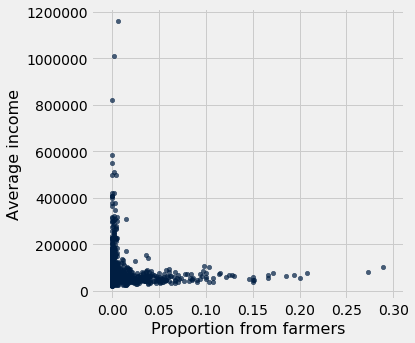

In [34]:
# Write code to make a scatter plot here.
average_per_zip=Table().with_columns(
    "Average income", np.round(income_with_farmer_proportion.column(2)*1000/income_with_farmer_proportion.column(1)),
    "Proportion from farmers", income_with_farmer_proportion.column(4),
    
)
average_per_zip.scatter("Proportion from farmers","Average income")

**Question 2.8.** From the graph, can you say whether ZIP codes with more farmers typically have lower or higher average income than ZIP codes with few or no farmers?  Can you say how much lower or higher?

zip codes with more farmers... generally do not have high incomes compared to a number of zip codes with a lower proportion of farmers. Maybe typically have lower income than zip codes with few farmers?



#not sure how to quantify how much... maybe find the average income of zip codes without farmers and the average income of zip codes with farmers... and find per .01 proportion of farmers in the population causes a change in the average income between those ZIp with farmers and those without. 

**Question 2.9.** Compare the average incomes for two groups of *tax returns*: those in ZIP codes with a greater-than-average proportion of farmers and those in ZIP codes with a less-than-average (or average) proportion. Make sure both of these values are displayed (preferably in a table). *Then, describe your findings.*

*Hint:* Make sure your result correctly accounts for the number of tax returns in each ZIP code, as in questions 2.5 and 2.6.

In [35]:
average_proportion=np.mean(income_with_farmer_proportion.column(4))
average_proportion

0.00897316247969098

In [36]:
greater_than_average_farmers=income_with_farmer_proportion.where("proportion from farmers", are.above(average_proportion))
greater_than_average_farmers
many_farmer_ZIP_average_income=np.round((greater_than_average_farmers.column(2).sum()*1000)/(greater_than_average_farmers.column(1).sum()))
many_farmer_ZIP_average_income

60428.0

In [37]:
other_zip_codes=income_with_farmer_proportion.where("proportion from farmers", are.below_or_equal_to(average_proportion))
other_zip_codes
other_farmer_ZIP_average_income=np.round((other_zip_codes.column(2).sum()*1000)/(other_zip_codes.column(1).sum()))
other_farmer_ZIP_average_income

73917.0

In [38]:
# Build and display a table with two rows:
#   1) avg incomes of returns in ZIP codes with a greater-than-average proportion of farmers
#   2) avg incomes of returns in other ZIP codes


new=Table().with_columns(
    'groups', ['many farmers ZIP code avg incomes:','other ZIP codes avg incomes:'],
    'avg incomes', [many_farmer_ZIP_average_income,other_farmer_ZIP_average_income],
)
new

groups,avg incomes
many farmers ZIP code avg incomes:,60428
other ZIP codes avg incomes:,73917


zip codes with many farmers have a lower avg income than the other zip codes with less than avg proportion of farmers. 

**Question 2.10.** The graph below displays two histograms: the distribution of average incomes of ZIP codes that have above-average proportions of farmers, and that of ZIP codes with below-average proportions of farmers.

<img src="https://i.imgur.com/jicA2to.png"/>

Are ZIP codes with below-average proportions of farmers more or less likely to have very low incomes?  Explain how your answer is consistent with your answer to question 2.8.

zip codes with below avg prop of farmers(yellow) are more likely to have very low incomes (they have the lowest in fact, on the chart, However, there are also many more zip codes that make much more than the zip codes with many farmers, which must cause the average overall to be greater, in spite of many people still making much less than farmers do. 

ZIP codes cover all the land in California and do not overlap. Here's a map of all of them.

<img src="california-zip-code-map.jpg" alt="CA ZIP Codes"/>

**Question 2.11.** Among the ZIP codes represented in the `income` table, is there an association between high average income and some aspect of the ZIP code's location? If so, describe one aspect of the location that is clearly associated with high income.

Answer the question by drawing a map of all ZIP codes that have an average income above 100,000 dollars. *Then, describe an association that you observe.*

In order to create a map of certain ZIP codes, you need to:
- Construct a table containing only the ZIP codes of interest, called `high_average_zips`.
- Join `high_average_zips` with the `zip_features` table to find the region for each ZIP code of interest.
- Call `Map(...)` on the column of features (provided).

In [39]:
income_with_avg=income.with_column(
'avg income per return (k)', np.round(income.column(2)*1000/income.column(1))
)
high_average_zips = income_with_avg.where('avg income per return (k)', are.above_or_equal_to(100000))
high_average_zips

ZIP,num returns,total income ($),num farmers,avg income per return (k)
90010,2210,"320,471",0,145010
90024,14690,"4,395,487",20,299216
90025,25110,"4,019,082",20,160059
90036,18880,"1,905,188",0,100910
90048,12630,"1,494,748",0,118349
90049,18350,"5,919,732",40,322601
90064,14540,"2,698,330",0,185580
90067,3190,"2,616,538",0,820231
90068,11940,"1,398,287",0,117109
90069,13930,"2,008,322",0,144172


In [40]:
zip_features = Table.from_records(zips.features)
high_zips_with_region = high_average_zips.join("ZIP", zip_features, "ZIP")
high_zips_with_region

ZIP   | num returns | total income ($) | num farmers | avg income per return (k) | feature                                                | id
90024 | 14690       | 4,395,487        | 20          | 299216                    | <datascience.maps.Region object at 0x000002B5F8A17470> | 1056
90025 | 25110       | 4,019,082        | 20          | 160059                    | <datascience.maps.Region object at 0x000002B5F8A174E0> | 1057
90036 | 18880       | 1,905,188        | 0           | 100910                    | <datascience.maps.Region object at 0x000002B5F8A176A0> | 1061
90048 | 12630       | 1,494,748        | 0           | 118349                    | <datascience.maps.Region object at 0x000002B5F8A17860> | 1065
90049 | 18350       | 5,919,732        | 40          | 322601                    | <datascience.maps.Region object at 0x000002B5F8A12E10> | 1042
90064 | 14540       | 2,698,330        | 0           | 185580                    | <datascience.maps.Region object at 0x000002B5F8A179B0> | 1068
90067 | 3190        | 2,616,538        | 0           | 820231                    | <datascience.maps.Region object at 0x000002B5F8A17A90> | 1070
90068 | 11940       | 1,398,287        | 0           | 117109                    | <datascience.maps.Region object at 0x000002B5F8A17B00> | 1071
90069 | 13930       | 2,008,322        | 0           | 144172                    | <datascience.maps.Region object at 0x000002B5F8A17B70> | 1072
90077 | 4110        | 1,678,772        | 0           | 408460                    | <datascience.maps.Region object at 0x000002B5F8A17C50> | 1074
... (226 rows omitted)

In [56]:
# Write code to draw a map of only the high-income ZIP codes.
# We have filled in some of it and suggested names for variables
# you might want to define.

#map function seems to not be able to use the whole array, need to slice a part of it to be used.. 

Map(high_zips_with_region.column('feature')[0:170:1], width=400, height=300)

Zip codes witht the highest incomes are concentrated around the bay, monterey(around salinas?) and los angeles. as compared to the land area that is inland, mostly farm area. 

Part 3: Water Usage
======
We will now investigate water usage in California. The `usage` table contains three columns:

- `PWSID`: The Public Water Supply Identifier of the district
- `Population`: Estimate of average population served in 2015
- `Water`: Average residential water use (gallons per person per day) in 2014-2015

In [42]:
# Run this cell to create the usage table.

usage_raw.set_format(4, NumberFormatter)
max_pop = usage_raw.select(0, 'population').group(0, max).relabeled(1, 'Population')
avg_water = usage_raw.select(0, 'res_gpcd').group(0, np.mean).relabeled(1, 'Water')
usage = max_pop.join('pwsid', avg_water).relabeled(0, 'PWSID')
usage

PWSID,Population,Water
0110001,340000,70.7
0110003,57450,90.2727
0110005,1390000,76
0110006,151037,57.1818
0110008,73067,96.6364
0110009,79547,68.6364
0110011,31994,85.8182
0310003,23347,82.8182
0410002,101447,142
0410005,11208,88.8182


In [43]:
z=usage.select('PWSID','Water')
z

PWSID,Water
0110001,70.7
0110003,90.2727
0110005,76
0110006,57.1818
0110008,96.6364
0110009,68.6364
0110011,85.8182
0310003,82.8182
0410002,142
0410005,88.8182


**Question 3.1.** Draw a map of the water districts, colored by the per capita water usage in each district.

Use the `districts.color(...)` method to generate the map. It takes as its first argument a two-column table with one row per district that has the district `PWSID` as its first column. The label of the second column is used in the legend of the map, and the values are used to color each region.

In [59]:
# We have filled in the call to districts.color(...).  Set per_capita_usage
# to an appropriate table so that a map of all the water districts is
# displayed.
per_capita_usage = usage.select('PWSID','Water')
districts.color(per_capita_usage, key_on='feature.properties.PWSID') 

In [45]:
_ = tests.grade('q31')

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Running tests

---------------------------------------------------------------------
Test summary
    Passed: 2
    Failed: 0
[ooooooooook] 100.0% passed



**Question 3.2.** Based on the map above, which part of California appears to use more water per person: the San Francisco area or the Los Angeles area? 

*Write your answer here, replacing this text.*

Next, we will try to match each ZIP code with a water district. ZIP code boundaries do not always line up with water districts, and one water district often covers multiple ZIP codes, so this process is imprecise. It is even the case that some water districts overlap each other. Nonetheless, we can continue our analysis by matching each ZIP code to the water district with the largest geographic overlap.

The table `wd_vs_zip` describes the proportion of land in each ZIP code that is contained in each water district and vice versa. (The proportions are approximate because they do not correctly account for discontiguous districts, but they're mostly accurate.)

In [66]:
wd_vs_zip.show(10)
               

PWSID,ZIP,District in ZIP,ZIP in District
0110001,94536,9.41%,68.51%
0110001,94538,18.87%,67.31%
0110001,94539,13.13%,44.36%
0110005,94541,1.61%,68.11%
0110006,94541,18.68%,98.46%
0110005,94542,0.17%,6.79%
0110006,94542,18.24%,91.80%
0110001,94544,0.33%,3.02%
0110005,94544,0.00%,0.01%
0110006,94544,28.24%,97.61%


In [108]:
type(wd_vs_zip.column("ZIP in District")[1])

numpy.float64

In [225]:
z=wd_vs_zip.where("ZIP", are.equal_to("11111"))
#print(((np.empty)))
#np.size(z.column(0))==np.size(np.array([]))
np.size(z.column(0))==np.size(np.array([]))

True

In [177]:
x=wd_vs_zip.where("ZIP", are.equal_to("11111")).column(3).max()

ValueError: zero-size array to reduction operation maximum which has no identity

In [176]:

y=z.where("ZIP in District", are.equal_to(x))
y

ValueError: zero-size array to reduction operation maximum which has no identity

In [154]:
y.column(("ZIP in District"))[0]

1.0

**Question 3.3.** Complete the `district_for_zip` function that takes a ZIP code as its argument. It returns the PWSID with the largest value of `ZIP in District` for that `zip_code`, if that value is at least 50%. Otherwise, it returns the string `'No District'`.

In [228]:
def district_for_zip(zip_code):
    zip_code = str(zip_code) # Ensure that the ZIP code is a string, not an integer
    districts = wd_vs_zip.where("ZIP", are.equal_to(zip_code)) #narrow table to just this zip code
    if np.size(districts.column(0))==np.size(np.array([])): #if empty, return No district
        return 'No District'
    
    max_zip_in_district_percent=wd_vs_zip.where("ZIP", are.equal_to(zip_code)).column(3).max() #find the max 'zip in district'... probably better to have sorted this list and taken the first entry instead
    max_zip_in_district= districts.where("ZIP in District", are.equal_to(max_zip_in_district_percent))
    at_least_half = ( .5 <= max_zip_in_district.column(("ZIP in District"))[0])
    #print(max_zip_in_district) #check for values...
    if at_least_half:
        return str(max_zip_in_district.column("PWSID")[0])
    else:
        return 'No District'

print(district_for_zip(11111))

No District


In [229]:
_ = tests.grade('q33')

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Running tests

---------------------------------------------------------------------
Test summary
    Passed: 6
    Failed: 0
[ooooooooook] 100.0% passed



This function can be used to associate each ZIP code in the `income` table with a `PWSID` and discard ZIP codes that do not lie (mostly) in a water district.

In [255]:
zip_pwsids = income.apply(district_for_zip, 'ZIP')
income_with_pwsid = income.with_column('PWSID', zip_pwsids).where('PWSID', are.not_equal_to("No District"))
income_with_pwsid.set_format(2, NumberFormatter(0)).show(5)

ZIP,num returns,total income ($),num farmers,PWSID
90001,20970,"531,772",0,1910067
90022,26680,"767,484",0,1910036
90024,14690,"4,395,487",20,1910067
90025,25110,"4,019,082",20,1910067
90034,29950,"1,828,572",0,1910067


**Question 3.4.** Create a table called `district_data` with one row per PWSID and the following columns:

- `PWSID`: The ID of the district
- `Population`: Population estimate
- `Water`: Average residential water use (gallons per person per day) in 2014-2015
- `Income`: Average income in dollars of all tax returns in ZIP codes that are (mostly) contained in the district according to `income_with_pwsid`.

*Hint*: First create a `district_income` table that sums the incomes #Bullshit-> and returns for ZIP codes in each water district.

In [355]:
#district_data is usage, appended with income column

returns=income_with_pwsid.select('PWSID','num returns').group('PWSID',sum) #table with total number of returns per PWSID
district_income=income_with_pwsid.select('PWSID','total income ($)').group('PWSID',sum) #Table with the total income per PWSID
z=Table().with_columns( #create temp table z with the Income per return, 'income' column
    'PWSID',np.unique(income_with_pwsid.column(4)),
    'Income', district_income.column(1)*1000/returns.column(1)
)
#district_income=income_with_pwsid.group('PWSID',)
    
district_data=usage.join('PWSID',z,'PWSID') #join 'income' column to the usage table
district_data
district_data.set_format(make_array('Population', 'Water', 'Income'), NumberFormatter(0))


PWSID,Population,Water,Income
0110001,"340,000",71,"79,032"
0110005,"1,390,000",76,"82,497"
0110006,"151,037",57,"52,924"
0110008,"73,067",97,"163,257"
0110009,"79,547",69,"133,902"
0410002,"101,447",142,"50,401"
0410006,"18,300",286,"38,721"
0410011,"9,615",92,"44,707"
0710001,"106,455",110,"53,551"
0710003,"197,536",102,"73,914"


In [353]:
_ = tests.grade('q34')

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Running tests

---------------------------------------------------------------------
Test summary
    Passed: 2
    Failed: 0
[ooooooooook] 100.0% passed



**Question 3.5.** The `bay_districts` table gives the names of all water districts in the San Francisco Bay Area. Is there an association between water usage and income among Bay Area water districts? Use the tables you have created to compare water usage between the 10 Bay Area water districts with the highest average income and the rest of the Bay Area districts, then describe the association. *Do not include any districts in your analysis for which you do not have income information.*

The names below are just suggestions; you may perform the analysis in any way you wish.

*Note*: Some Bay Area water districts may not appear in your `district_data` table. That's ok. Perform your analysis only on the subset of districts where you have both water usage & income information.

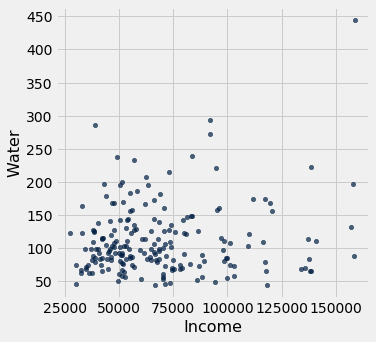

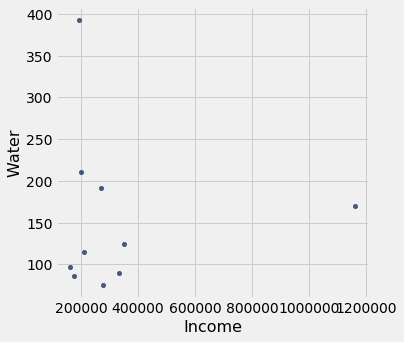

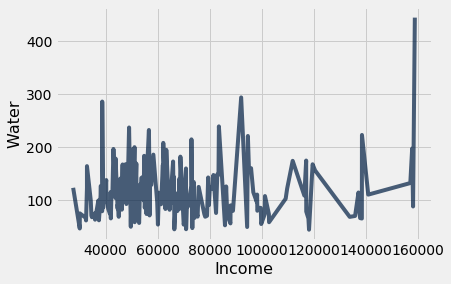

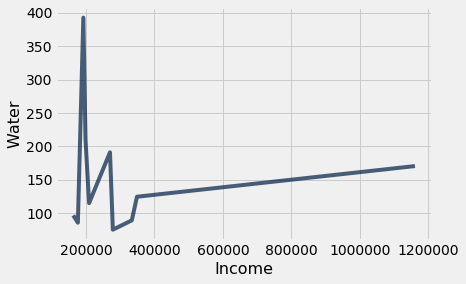

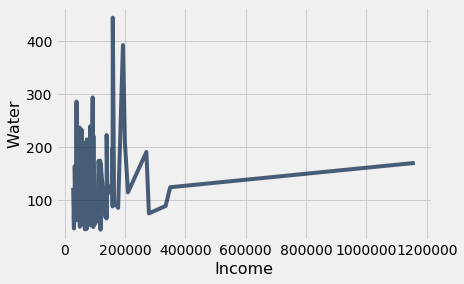

In [412]:
top_ten=district_data.sort("Income", descending=True).take(np.arange(10))

other=district_data.sort("Income", descending=True).where('Income', are.below(top_ten_income.column(3)[9]))


bay_districts = Table.read_table('bay_districts.csv')

other.scatter('Income','Water')
top_ten.scatter('Income','Water')
other.plot('Income','Water')
top_ten.plot('Income','Water')


In [409]:
top_ten.column('Water').mean()-other.column('Water').mean()


42.81173863636364

In [ ]:

bay_water_vs_income = ...
top_10 = ...
...

*Complete this one-sentence conclusion:* In the Bay Area, people in the top 10 highest-income water districts used an average of `43` more gallons of water per person per day than people in the rest of the districts.

**Question 3.6.** In one paragraph, summarize what you have discovered through the analyses in this project and suggest what analysis should be conducted next to better understand California water usage, income, and geography. What additional data would be helpful in performing this next analysis?

Zip codes in 3 urban/bay areas have the highest income, as compared to rural areas, but also have many people with less income than in rural. On average it is higher though for urban. 

There is a rough association of water use with income, espcially among the outliers for income... however for much of the 'other' graph, shows an other wise erratic association indicating that water usage varies widely with income. which makes sense as agricultural areas with less average income may have much higher water usage.

More attention should be paid to the particular zip codes that are not LA/SF to confirm whether these are urban areas and justifiably have higher incomes compared to rural ZIP

Would be worth studying the outliers in water usage to confirm whether these are rural or urban, and whether there is an association between urban zip codes and water usage vs rural zip codes and water usage.

more data allowing the classification of zip codes as rural or urban may be useful...

Congratulations - you've finished Project 1 of Data 8! 

To submit:

1. Select `Run All` from the `Cell` menu to ensure that you have executed all cells, including the test cells.  Make sure that the visualizations you create are actually displayed.
2. Select `Download as PDF via LaTeX (.pdf)` from the `File` menu.  (Sometimes that seems to fail.  If it does, you can download as HTML, open the .html file in your browser, and print it to a PDF.)
3. Read that file! If any of your lines are too long and get cut off, we won't be able to see them, so break them up into multiple lines and download again. If maps do not appear in the output, that's ok.
4. Submit that downloaded file (called `project1.pdf`) to Gradescope.

If you cannot submit online, come to office hours for assistance. The office hours
schedule appears on [data8.org/weekly](http://data8.org/weekly).

In [413]:
# For your convenience, you can run this cell to run all the tests at once!
import os
_ = [tests.grade(q[:-3]) for q in os.listdir("tests") if q.startswith('q')]

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Running tests

---------------------------------------------------------------------
Test summary
    Passed: 2
    Failed: 0
[ooooooooook] 100.0% passed

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Running tests

---------------------------------------------------------------------
Test summary
    Passed: 2
    Failed: 0
[ooooooooook] 100.0% passed

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Running tests

---------------------------------------------------------------------
Test summary
    Passed: 1
    Failed: 0
[ooooooooook] 100.0% passed

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Running tests

---------------------------------------------------------------------
Test summary
    Passed: 2
    Failed: 0
[ooooooooook] 100.0% passed

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Running tests

---------------

If you want, draw some more maps below.

In [ ]:
# Your extensions here (completely optional)